<div style="width:100%; height:140px">
    <img src="https://www.kuleuven.be/internationaal/thinktank/fotos-en-logos/ku-leuven-logo.png/image_preview" width = 300px, heigh = auto align=left>
</div>


KUL H02A5a Computer Vision: Group Assignment 1
---------------------------------------------------------------
Student numbers: <span style="color:red">r0481422, r0774566, r0766888, r0692123, r0856883</span>.

Dear fellow students, welcome to ECCV 2021! In this tutorial, we would like to present you how to use different techniques for feature representation to describe objects of interest and perform face recognition task using these features. 


---------------------------------------------------------------
This tutorial notebook is structured as follows:

0. Data loading & Preprocessing
1. Feature Representations
2. Evaluation Metrics 
3. Experiments
4. Hybrid Feature Represention
5. Transfer Learning with VGGFace 2
6. Results
7. Discussion


<span style="color:red">(Remark: this structure need to be adapted and confirmed before submission)</span>

We start by preparing the dataset using face detection. Then we will extract compact and discriminative feature vectors from face images using different representation methods such as HOG, SIFT and PCA. After we obtain the feature vectors from these methods, we will use mutiple machine learning techniques to learn different classification models, which can be used to recognize face in the new images. Beside, we will also exam the performance of VGGFace Model via transfer learning. 

So without further ado, let's get started!


---------------------------------------------------------------
# 0. Data loading & Preprocessing

## 0.1. Loading data
The training set(80 images) is many times smaller than the test set(1816 images) and this might strike you as odd, however, this is close to a real world scenario where your system might be put through daily use! In this session we will try to do the best we can with the data that we've got! 



In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python

import io # Input/Output Module
import os # OS interfaces
import cv2 # OpenCV package
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

from urllib import request # module for opening HTTP requests
from matplotlib import pyplot as plt # Plotting library

In [2]:
# Input data files are available in the read-only "../input/" directory

train = pd.read_csv(
    '/kaggle/input/kul-h02a5a-computervision-groupassignment0/train_set.csv', index_col = 0)
train.index = train.index.rename('id')

test = pd.read_csv(
    '/kaggle/input/kul-h02a5a-computervision-groupassignment0/test_set.csv', index_col = 0)
test.index = test.index.rename('id')

# read the images as numpy arrays and store in "img" column
train['img'] = [cv2.cvtColor(np.load('/kaggle/input/kul-h02a5a-computervision-groupassignment0/train/train/train_{}.npy'.format(index), allow_pickle=False), cv2.COLOR_BGR2RGB) 
                for index, row in train.iterrows()]

test['img'] = [cv2.cvtColor(np.load('/kaggle/input/kul-h02a5a-computervision-groupassignment0/test/test/test_{}.npy'.format(index), allow_pickle=False), cv2.COLOR_BGR2RGB) 
                for index, row in test.iterrows()]
  

train_size, test_size = len(train),len(test)

"The training set contains {} examples, the test set contains {} examples.".format(train_size, test_size)

'The training set contains 80 examples, the test set contains 1816 examples.'

*Note: this dataset is a subset of the* [*VGG face dataset*](https://www.robots.ox.ac.uk/~vgg/data/vgg_face/).

## 0.2. A first look
Let's have a look at the data columns and class distribution.

In [3]:
# The training set contains an identifier, name, image information and class label
train.head(1)

,name,class,img
id,,,
0,Mila_Kunis,2,"[[[50, 31, 25], [49, 30, 24], [49, 30, 24], [4..."


In [4]:
# The test set only contains an identifier and corresponding image information.

test.head(1)

,img
id,
0,"[[[209, 210, 205], [208, 209, 204], [208, 209,..."


In [5]:
# The class distribution in the training set:
train.groupby('name').agg({'img':'count', 'class': 'max'})

,img,class
name,,
Jesse_Eisenberg,30,1
Michael_Cera,10,0
Mila_Kunis,30,2
Sarah_Hyland,10,0


Note that **Jesse is assigned the classification label 1**, and **Mila is assigned the classification label 2**. The dataset also contains 20 images of **look alikes (assigned classification label 0)** and the raw images. 

## 0.3. Preprocess data
### 0.3.1 Manually preprocessing on training set

There are inheritly some flaws reside in the training images. To obtain a clear version of the trianing data to avoid confusion with our classifiers, we first manually correct some of the pictures.

1. Pictures containing two people that will lead the preprocessor to detect the  ther person: cutting the other person out

In [6]:
cut40 = train["img"][40][0:400, 60:400]
cut49 = train["img"][49][0:200,0:200]
cut52 = train["img"][52][0:400,250:500]
cut53 = train["img"][53][0:200,250:400]
cut70 = train["img"][70][0:250, 175:300]
train["img"][40] = cut40
train["img"][49] = cut49
train["img"][52] = cut52
train["img"][53] = cut53
train["img"][70] = cut70

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value

2. One of the Mila image is damaged originally, we replace it by an Mila image found online:

In [7]:
mila65 = cv2.imread("../input/mila-extra/mila65.jpg")
mila65 = cv2.cvtColor(mila65, cv2.COLOR_BGR2RGB)
mila65 = mila65[0:1200, :]
mila65 = cv2.resize(mila65, (250, 300))
train["img"][65] = mila65

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


### 0.3.2 Rewriting HAARPreprocessor function
The original HAARPreprocessor function returns only the first detected face, however this can sometimes be faulty faces as we saw e.g. backgroud or jaws being detected instead of the correct face. To solve this issue, we rewrite the HAARPreprocessor function to return the face with highest confidence level. 
Combining the manipulation on training images we discussed above, now the detected faces are correct, i.e. we have a clean training set.

In [8]:
class HAARPreprocessor_bestface():
    """Preprocessing pipeline built around HAAR feature based cascade classifiers. """
    def __init__(self, path, face_size):
        self.face_size = face_size
        file_path = os.path.join(path, "haarcascade_frontalface_default.xml")
        if not os.path.exists(file_path): 
            if not os.path.exists(path):
                os.mkdir(path)
            self.download_model(file_path)
        
        self.classifier = cv2.CascadeClassifier(file_path)
  
    def download_model(self, path):
        url = "https://raw.githubusercontent.com/opencv/opencv/master/data/"\
            "haarcascades/haarcascade_frontalface_default.xml"
        
        with request.urlopen(url) as r, open(path, 'wb') as f:
            f.write(r.read())
            
    def detect_faces(self, img):
        """Detect all faces in an image."""
        img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        return self.classifier.detectMultiScale3(
            img_gray,
            scaleFactor=1.1,
            minNeighbors=1,
            minSize=(30, 30),
            flags=cv2.CASCADE_SCALE_IMAGE,
            outputRejectLevels = True
        )
        
    def extract_faces(self, img):
        rt = self.detect_faces(img)
        return rt
    
    def preprocess(self, data_row):
        messages = self.extract_faces(data_row)
        faces = messages[0] #numpy.ndarray
        # if no faces were found, return None
        if len(faces) == 0:
            nan_img = np.empty(self.face_size + (3,))
            nan_img[:] = np.nan
            return nan_img
        
        conf = messages[2]
        best_face_points = faces[np.argmax(conf)]
        best_face = data_row[best_face_points[1]:best_face_points[1]+best_face_points[3], best_face_points[0]:best_face_points[0]+best_face_points[2]]
        return cv2.resize(best_face, self.face_size, interpolation = cv2.INTER_AREA)
    
    def __call__(self, data):
        rt = []
        for row in data:
            rt.append(self.preprocess(row))
        cvt2array = np.array(rt, dtype = int)
        return cvt2array

**Visualise**

Now we are ready to do face detection:

In [9]:
def plot_image_sequence(data, n, imgs_per_row=7):
    n_rows = 1 + int(n/(imgs_per_row+1))
    n_cols = min(imgs_per_row, n)

    f,ax = plt.subplots(n_rows,n_cols, figsize=(10*n_cols,10*n_rows))
    for i in range(n):
        if n == 1:
            ax.imshow(data[i])
        elif n_rows > 1:
            ax[int(i/imgs_per_row),int(i%imgs_per_row)].imshow(data[i])
        else:
            ax[int(i%n)].imshow(data[i])
    plt.show()

In [10]:




    
#preprocessed data 
FACE_SIZE = (100, 100)
preprocessor_bestface = HAARPreprocessor_bestface(path = '../../tmp', face_size=FACE_SIZE)
train_X_bestface = preprocessor_bestface(train['img'].values) # this is kept as the same data type and shape as the original method
test_X_bestface = preprocessor_bestface(test['img'].values)
train_y = train['class'].values



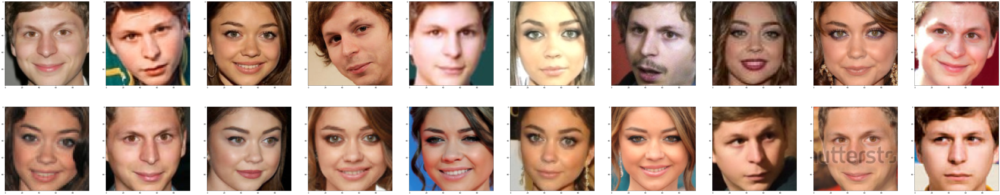

In [11]:
# plot faces of Michael and Sarah

plot_image_sequence(train_X_bestface[train_y == 0], n=20, imgs_per_row=10)

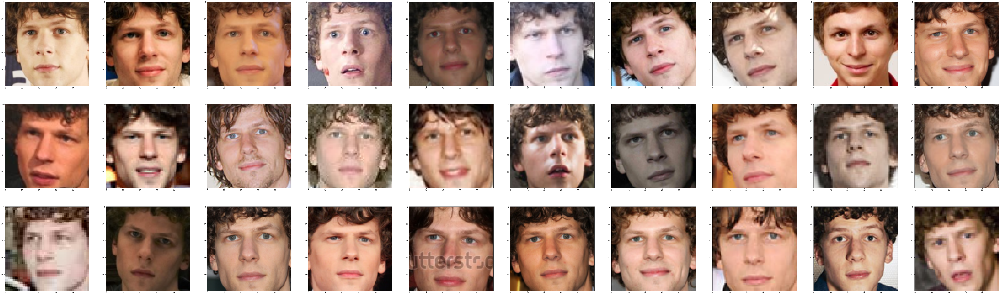

In [12]:
# plot faces of Jesse

plot_image_sequence(train_X_bestface[train_y == 1], n=30, imgs_per_row=10)

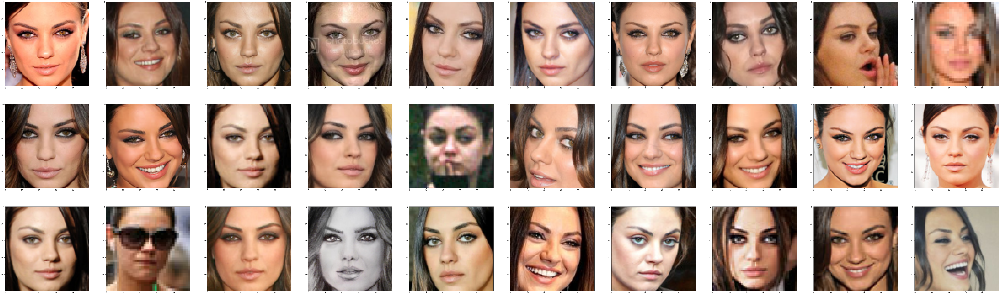

In [13]:
# plot faces of Mila

plot_image_sequence(train_X_bestface[train_y == 2], n=30, imgs_per_row=10)

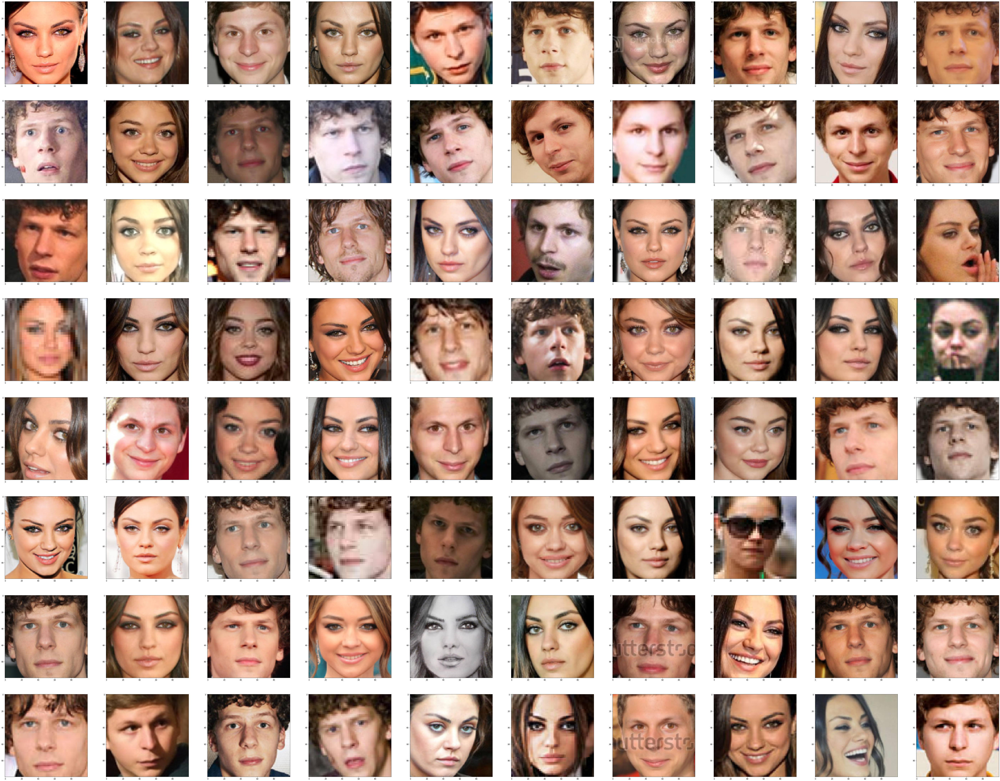

In [14]:
# plot faces of training data

plot_image_sequence(train_X_bestface, n=80, imgs_per_row=10)

create new training dataset after dropping the unwanted detected face images

## 0.4. Store Preprocessed data 


In [15]:
# save preprocessed data
prep_path = '/kaggle/working/prepped_data/'
if not os.path.exists(prep_path):
    os.mkdir(prep_path)
    
np.save(os.path.join(prep_path, 'train_X_bestface.npy'), train_X_bestface)
np.save(os.path.join(prep_path, 'train_y.npy'), train_y)
np.save(os.path.join(prep_path, 'test_X_bestface.npy'), test_X_bestface)

Now we are ready to rock!

# 1. Feature Representations
## 1.0. Load the preprocessed bestface data


In [16]:
# load preprocessed data
prep_path = '../input/preppeddata/'
if not os.path.exists(prep_path):
    os.mkdir(prep_path)
train_X = np.load(os.path.join(prep_path, 'train_X_bestface.npy'))
train_y = np.load(os.path.join(prep_path, 'train_y.npy'))
test_X = np.load(os.path.join(prep_path, 'test_X_bestface.npy'))

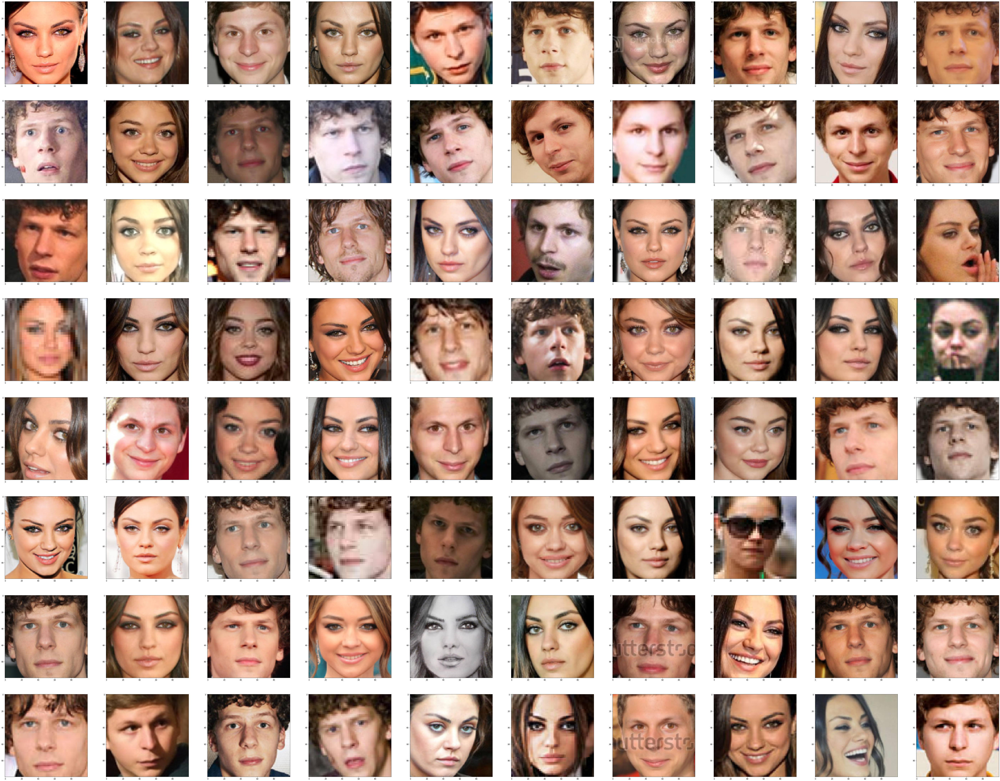

In [17]:
# plot faces of loaded training data

plot_image_sequence(train_X, n=80, imgs_per_row=10)

## 1.1. HOG feature extractor

A feature descriptor is a representation of an image or an image patch that simplifies the image by extracting useful information and disgarding extraneous information.
The histogram of oriented gradients (HOG) is one of the feature descriptors used for object detection in computer vision.

---------------------------------------------------------------
### 1.1.1 How to calculate HOG of an image

1. Using a size of pixel cell,for example: 8x8. compute the gradient magnitude and direction. The can be use done by calculating the horizontal and vertical gradient. Then use the following equation to its magnitude and orientation: 

<center><img src="https://learnopencv.com/wp-content/ql-cache/quicklatex.com-63f6cd0dabced613d560b807221f8527_l3.png"/></center>

2. Create a histogram of generated 64 (with 8x8 pixel cell) gradient vectors. In the histogram, each cell is split into angular bins, each bins corresponds to a gradient direction (9 bins 0-180°) (20° each bin). This reduct the 64 vectors to just 9 values. 

<center><img src="https://learnopencv.com/wp-content/uploads/2016/12/histogram-8x8-cell.png"/></center>

3.  We created a histogram based on the gradient of the image, which are sensitive to overall lighting. We want to the descriptor to be independent of lighting variation by normalization, for instance L2 norm of the vector. For example, a vector [128,64,32],the length of the vector is $\sqrt{128^2 + 64^2 + 32^2} = 146.64$. Then we divide each element of the vector by 146.64, we obtain [0.87, 0.43, 0.22]. We will normalize over a bigger block size. Each block will has 4 histograms which can be concatenated to a form a 36x1 element vector. Then we will normalize the vector. 

### 1.1.2 Code Implementation to Extract HOG feature
Now let's see how to extract the HOG feature vector for datasets. First we will need to import required libraries:

In [18]:
#importing required libraries
from skimage.io import imread
from skimage.transform import resize
from skimage.feature import hog
from skimage import exposure
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.preprocessing import StandardScaler, Normalizer
import skimage

We need to convert color images to grayscale, calculate their HOGs and finally scale the data. For this we will need three transformers: **RGB2GrayTransformer, HOGTransformer and StandardScaler**. The final result is an array with a HOG for every image in the input.

In [19]:
class RGB2GrayTransformer(BaseEstimator, TransformerMixin):
    """
    Convert an array of RGB images to grayscale
    """
 
    def __init__(self):
        pass
 
    def fit(self, X, y=None):
        """returns itself"""
        return self
 
    def transform(self, X, y=None):
        """perform the transformation and return an array"""
        return np.array([skimage.color.rgb2gray(img) for img in X])

        
class HogTransformer(BaseEstimator, TransformerMixin):
    """
    Expects an array of 2d arrays (1 channel images)
    Calculates hog features for each img
    """
 
    def __init__(self, y=None, orientations=9,
                 pixels_per_cell=(8, 8),
                 cells_per_block=(3, 3), block_norm='L2-Hys'):
        self.y = y
        self.orientations = orientations
        self.pixels_per_cell = pixels_per_cell
        self.cells_per_block = cells_per_block
        self.block_norm = block_norm
 
    def fit(self, X, y=None):
        return self
 
    def transform(self, X, y=None):
 
        def local_hog(X):
            return hog(X,
                       orientations=self.orientations,
                       pixels_per_cell=self.pixels_per_cell,
                       cells_per_block=self.cells_per_block,
                       block_norm=self.block_norm)
 
        try: # parallel
            return np.array([local_hog(img) for img in X])
        except:
            return np.array([local_hog(img) for img in X])
        
# create an instance of each transformer
def HOGFeature_extractor(X):
    grayify = RGB2GrayTransformer()
    hogify = HogTransformer(
        pixels_per_cell=(14, 14), 
        cells_per_block=(2,2), 
        orientations=9, 
        block_norm='L2-Hys'
    )
    scalify = StandardScaler()
    # call fit_transform on each transform converting X_train step by step
    X_train_gray = grayify.fit_transform(X)
    X_train_hog = hogify.fit_transform(X_train_gray)
    X_train_prepared = scalify.fit_transform(X_train_hog)
    
    return X_train_prepared

Let's obtain the HOG feature vectors for train and test set. Notice that the above implmentation use 14x14 pixel cell and 2x2 cells per block. 

How many block positions do we have? 100/14 = 7.14. So we have 6 horizontal and 6 vertical positions, which makes total of 36 positions. Each block is represented by 36x1 vector, so the final feature vector is a 36x36=1296 dimensional vector. 

In [20]:
train_X_HOG = HOGFeature_extractor(train_X)
test_X_HOG = HOGFeature_extractor(test_X)

Let's take a look at the size of feature vectors of the images.It is 1296, which is around 13% of the original image size (10000).

In [21]:
train_X_HOG.shape

(80, 1296)

### 1.1.3. t-SNE Plots
Let's plot the t-SNE Plots to see how HOG features can distinguish the training dataset.

[t-SNE] Computing 79 nearest neighbors...
[t-SNE] Indexed 80 samples in 0.001s...
[t-SNE] Computed neighbors for 80 samples in 0.008s...
[t-SNE] Computed conditional probabilities for sample 80 / 80
[t-SNE] Mean sigma: 12.451036
[t-SNE] KL divergence after 250 iterations with early exaggeration: 58.594711
[t-SNE] KL divergence after 300 iterations: 1.156540


<AxesSubplot:xlabel='tsne-2d-one', ylabel='tsne-2d-two'>

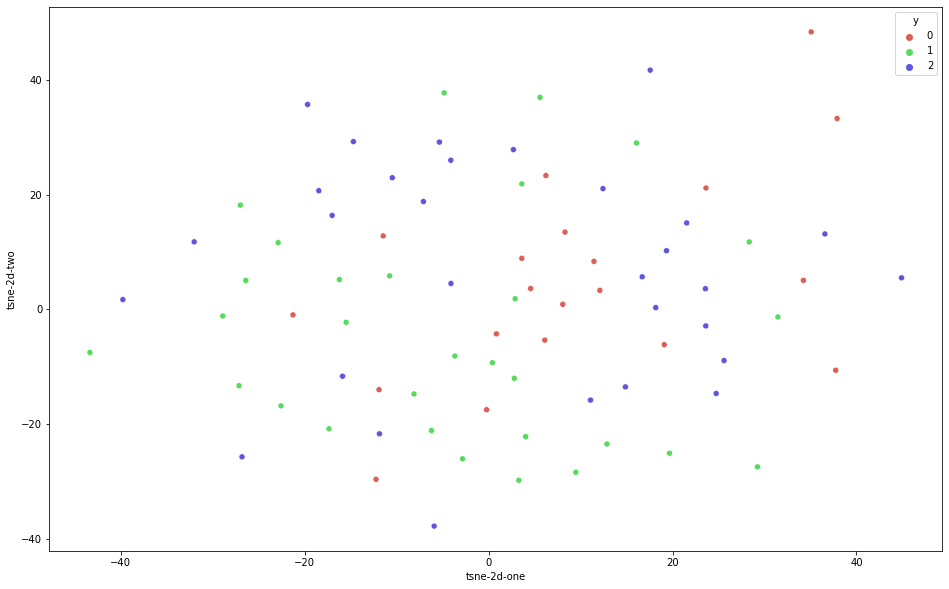

In [22]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(train_X_HOG)

N = tsne_results.shape[0]
vect1=tsne_results[:,0]
vect2=tsne_results[:,1]
vect3=train_y
df=pd.DataFrame({'tsne-2d-one':vect1,'tsne-2d-two':vect2,'y':vect3})

import seaborn as sns
plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue="y",
    palette=sns.color_palette("hls", 3),
    data=df,
    legend="full",
    alpha=1
)

The label-0-brown points represent the faces which are similar to label 1(Jesse, green points) and label 2 (Mila, blue points). From this plot we can see that HOG features don't give us the ideal seperation for the different label images and clustering for the same label images.

### 1.1.4. Discussion

HOGs is a type of feature descriptor used for object detection. It applies a sliding window detector over an image and HOG descriptor is computed for each position. In terms of large size image, it will lead to higher dimension of the feature vector, which requires the follow-up classifier to be able to handle high dimension data. 

## 1.2. PCA feature extractor
### 1.2.0 Prepare Work
Let's define three functions to plot face images, face images with predicted label and eigenface respectively.

In [23]:
def plot_image_sequence(data, n, imgs_per_row=10):
    n_rows = 1 + int(n/(imgs_per_row+1))
    n_cols = min(imgs_per_row, n)
    f,ax = plt.subplots(n_rows,n_cols, figsize=(10*n_cols,10*n_rows))
    for i in range(n):
        if n == 1:
            ax.imshow(data[i])
        elif n_rows > 1:
            ax[int(i/imgs_per_row),int(i%imgs_per_row)].imshow(data[i])
        else:
            ax[int(i%n)].imshow(data[i])
    plt.show()

    
def plot_predimage_sequence(data, label, n, imgs_per_row=10):
    n_rows = 1 + int(n/(imgs_per_row+1))
    n_cols = min(imgs_per_row, n)
    f,ax = plt.subplots(n_rows,n_cols, figsize=(10*n_cols,10*n_rows))
    for i in range(n):
        if n == 1:
            ax.set_title(label[i], fontsize= 50)
            ax.imshow(data[i])
        elif n_rows > 1:
            ax[int(i/imgs_per_row),int(i%imgs_per_row)].set_title(label[i], fontsize= 50)
            ax[int(i/imgs_per_row),int(i%imgs_per_row)].imshow(data[i])
        else:
            ax[int(i%n)].set_title(label[i], fontsize= 50)
            ax[int(i%n)].imshow(data[i])
    plt.show()


def plot_eigenface_sequence(data, n, imgs_per_row=10):
    n_rows = 1 + int(n/(imgs_per_row+1))
    n_cols = min(imgs_per_row, n)

    f,ax = plt.subplots(n_rows,n_cols, figsize=(10*n_cols,10*n_rows))
    for i in range(n):
        normed = cv2.normalize(data[i], 0, 255)
        if n == 1:
            ax.imshow(normed.astype('int32'), cmap="gray")
        elif n_rows > 1:
            ax[int(i/imgs_per_row),int(i%imgs_per_row)].imshow(normed.astype('int32'), cmap="gray")
        else:
            ax[int(i%n)].imshow(normed.astype('int32'), cmap="gray")
    plt.show()

FACE_SIZE = (100, 100)

In order to apply PCA, we need a data matrix. Here are two functions to convert a group of  3-D array images into a 2-D data matrix, where we “flatten” each image into a 1-D vector by a simple reshape function. After this operation, every column of matrix contains the pixel information of one image. 

In our PCA implementation, we use the second function to transform our images which use grayscale image to extract the main components. If we want get back to an image, just reshape it again.

In [24]:
def createDataMatrix(images):
    nrImg = len(images)
    dim = images[0].shape
    data = np.zeros((nrImg, dim[0]*dim[1]*dim[2]), dtype = np.float32)
    for i in range(0, nrImg):
        img = images[i].flatten()
        data[i,:] = img
    return data # it's np.ndarray, !!!

def createDataMatrix_gray(images):
    nrImg = len(images)
    dim = images[0].shape
    data = np.zeros((nrImg, dim[0]*dim[1]), dtype = np.float32)
    for i in range(0, nrImg):
        gray = cv2.cvtColor(images[i].astype('uint8'), cv2.COLOR_BGR2GRAY)
        img = gray.flatten()
        data[i,:] = img
    return data

Now let's transform the training set into a (80,100*100) matrix. The test set is processed the same way as well.

In [25]:
dm_all_gray = createDataMatrix_gray(train_X)
dm_test_gray = createDataMatrix_gray(test_X)

### 1.2.1. Learning features by PCA
Let's reduce the complexity of our original image to a lower dimension without lossing too much features by sklrean-PCA module.After PCA, we could use few components to represent our data which makes our computation more effcient.
________________________________________________________________________


In [26]:
from sklearn.decomposition import PCA

pca = PCA().fit(dm_all_gray)

The explained variance tells you how much information (variance) can be attributed to each of the principal components. This is important as when you convert high dimensional space to a lower dimensional space, you will lose some of the variance (information). By using the attribute explained_variance_ratio_, you can see that the first 30 components contains almost 90% of the variance. 


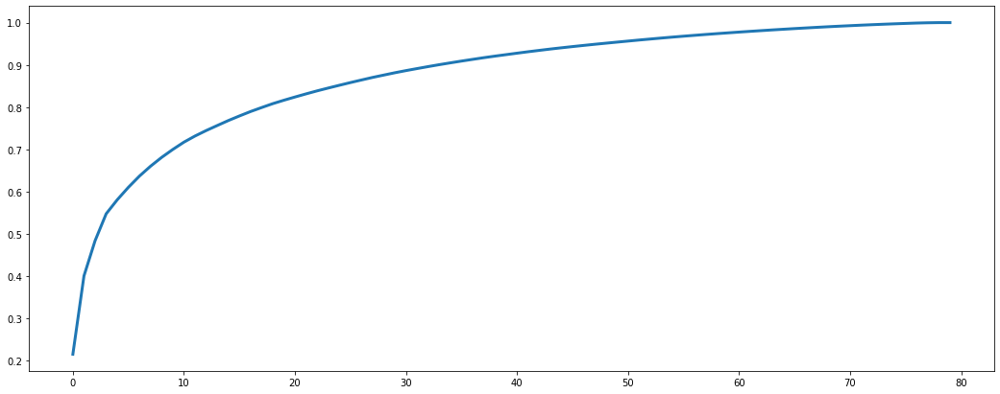

In [27]:
plt.figure(figsize=(18, 7))
plt.plot(pca.explained_variance_ratio_.cumsum(), lw=3)

Note that, we use the first 68 components to represent the original dataset, which have the explain_over_ratio over 99%.

In [28]:
np.where(pca.explained_variance_ratio_.cumsum() > 0.99)

(array([68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]),)

Once we determine the number of components to keep, let's perform PCA on both the training data and test data. 

In [29]:
pca = PCA(n_components = 68).fit(dm_all_gray)
train_X_PCA = pca.transform(dm_all_gray) # ndarray of size(80, 68) -> "weights" of each training sample on eigenvectors
test_X_PCA = pca.transform(dm_test_gray)

### 1.2.2. Averageface and Eigenface Plots
The "averageface" of training set is computed by the elementwise (pixelwise) mean over the images. 

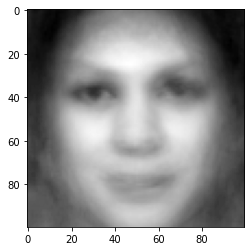

In [30]:
avgFace2 = pca.mean_.reshape(FACE_SIZE)
plt.imshow(avgFace2.astype('int32'), cmap="gray")

The "eigenfaces" are characteristic feature of faces and they are eigenvectors(principal components) of the face dataset. We can observe that the first eigenface is a male face which looks like Jesse whereas the second eigenface is a female face which looks like Mila. That's why the face of jesse and mila could be well separated when we use the first two eigenface to plot face space in the later stage.

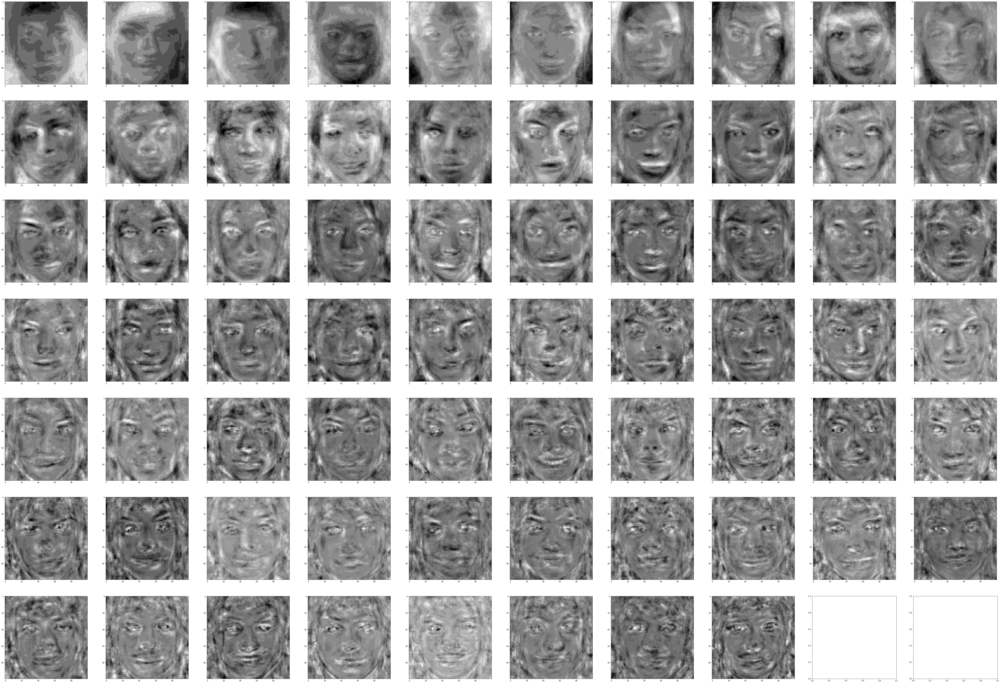

In [31]:
eigen_faces2 = [];
for ev in pca.components_: # aka. loading scores
    ef = ev.reshape(FACE_SIZE)
    eigen_faces2.append(ef) # eigen_faces2: list containing 68 ndarray of size(100,100)

plot_eigenface_sequence(eigen_faces2, 68)

### 1.2.3. Feature Space Plots
Classification occurs by projecting a new unknown face image into the subspace spanned by the eigenfaces. This subspace is called "face space". Then we can classify the face by comparing its position in face space with the faces position of the training set.

This code section is try to plot the train set on 2 dimensional data by the first two important components. Notice on the graph below we can observe that the red spot(Jesse) and blue spot(Mila) in train set are more close to 1st eigenface and 2nd eigenface respectively and they are well separated.

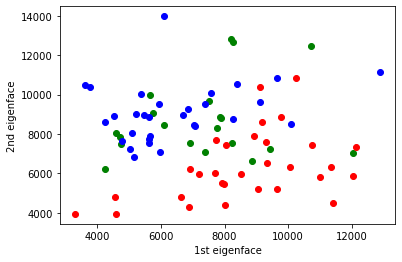

In [32]:
vec = pca.components_[0:2]
newData = np.dot(dm_all_gray, vec.T)

plt.scatter(newData[train_y==0,0], newData[train_y==0,1], color = "g")
plt.scatter(newData[train_y==1,0], newData[train_y==1,1], color = "r") # red spot: Jesse
plt.scatter(newData[train_y==2,0], newData[train_y==2,1], color = "b") # blue spot: Mila
plt.xlabel("1st eigenface")
plt.ylabel("2nd eigenface")
plt.show()

### 1.2.4. Discussion
PCA feature extraction is based on full singular value decomposition(SVD) which decompose a multivariate dataset into a set of successive orthogonal components. Therefore these orthogonal components are totally unrelated and could explain a maximum amount of the variance of data. 

In sklearn-PCA, it centers(mean substraction) but does not scale the input data (normalization) for each feature before applying the SVD.
The reason why mean substraction is neccessary is that we want to creat a system that is able to represent any face. If we extract the average face from face set, we will get the features that could distinguish each picture from the rest of set better. However, applying normalization will reduce the contrast of very dark and white pixels, we assume that dark part could represent the hair which would be very useful to recoginize Jesse and Mila, so in the PCA function we set the value of whiten parameter to false. 

## 1.3. SIFT feature extractor

## SIFT Bag of Words general explanation

Since we have tried a more classical approach for the HOG feature extractor, we decided that for SIFT it would be interesting to take a look at another technique: the bag of visual words technique. This technique comes from text classification but now we will use keypoints and descriptors instead of words. 

We use SIFT technique to extract features and descriptors from the images. This algorithm can detect the most prominent points in an image, which are referred as the keypoints. The keypoints show where in the image this prominent feature is located. This alone will usually not be enough: if the image would be rotated or zoomed out, these keypoints would be situated at other locations. This is why SIFT also provides descriptors of these keypoints. These descriptors comprise information about the area around the keypoints, so that the information regarding keypoints of one images can be compared to another.

These keypoints and descriptors can now be used for our bag of (visual) words technique. For this, we first retrieve all the descriptors for all pictures with the help of a function offered by OpenCV named "detectAndCompute". The output descriptors take the form of a list which looks like: [[descriptors of picture 1],[descriptors of picture 2], .. , [descriptors of last picture]].  As a second step, a k-means clustering approach is deployed on these arrays of descriptors. The centers of the resulting clusters are then seen as the 'words' or the features that we will compare our pictures to. The third step is to create a histogram set for key features to perform predictions later. To do this, all the images are looped through again. For each image, an empty histogram is created with as size the number of k-means centers. Now every descriptor of the picture is compared to the k-means centers. For every descriptor, the most similair center gets +1 added to the histogram. For instance, if there are 5 features in a picture and 10 k-means clustering centers, one would end up with a histogram that looks like this: [1,0,0,2,0,0,1,0,0,1]. 

These histograms are considered as the features for a chosen classifier. For each image that one intend to predict, the histogram is also created in the same manner as aforementioned and the classifier can then be used to predict the label of the image. In this specific case, two classifier named MLP (MultiLayer Perceptron) and SGD (Stochastic Gradient Descent) classifiers, both from thid-party packages, are tested. The results will be discussed in Section 1.1.2.

Sources:

https://towardsdatascience.com/bag-of-visual-words-in-a-nutshell-9ceea97ce0fb#:~:text=The%20general%20idea%20of%20bag,will%20always%20be%20the%20same.

https://medium.com/analytics-vidhya/bag-of-visual-words-bag-of-features-9a2f7aec7866

https://www.kaggle.com/pierre54/bag-of-words-model-with-sift-descriptors

In [33]:
from sklearn.cluster import MiniBatchKMeans
from sklearn.neural_network import MLPClassifier
import copy
class SIFTKnn2():
    
    def __init__(self,train_images,train_labels,k,selected_features):
        self.train_images = train_images
        self.train_labels = train_labels
        self.k = k * 10
        self.selected_features = selected_features
        self.sift = cv2.SIFT_create()
        self.bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True)
        
        
    
    def feature_matcher(self,des1,des2):
        # this definition takes 2 sets of descriptors and returns the best matches 
        matches = self.bf.match(des1,des2)
        #sort the matches by distance
        matches = sorted(matches, key = lambda x:x.distance)
        #ideally capable_feature_nums is the selected features but if there are not enough matches,all matches will be selected
        capable_feature_nums = min(self.selected_features,len(matches)) 
        matches = matches[0:capable_feature_nums]
        #gets the indexes of the best matches
        matched_feature_indexes_1 = np.zeros(capable_feature_nums,dtype = int)
        matched_feature_indexes_2 = np.zeros(capable_feature_nums,dtype = int)
        for i in range(capable_feature_nums):
            matched_feature_indexes_1[i] = int(matches[i].queryIdx)
            matched_feature_indexes_2[i] = int(matches[i].trainIdx)
        return matched_feature_indexes_1,matched_feature_indexes_2
    
    def extract_matched_features(self,all_images_descriptors):
        all_matched_descriptors = []
        
        #Loop through the descriptors (of all the images with the same label)
        for i in range(len(all_images_descriptors)):
            #For each image, its descriptors are set as a reference and the best matched features
            #with all other images are extracted and stored
            all_images_descriptors_copy = copy.deepcopy(all_images_descriptors)
            reference_descriptor = all_images_descriptors_copy.pop(i)
            
            all_matched_descriptors.append(reference_descriptor)
            for query_des in all_images_descriptors_copy:
                query_des_indexes,train_des_indexes = self.feature_matcher(query_des,reference_descriptor)
                all_matched_descriptors.append(query_des[query_des_indexes])

        return all_matched_descriptors
    
    def get_all_descriptors(self):
        all_descriptors = []
        Michael_and_Sarah_descriptors = []
        Jesse_descriptors = []
        Mila_descriptors = []
        #Store the non-matched features
        for img_count in range(len(self.train_images)):
            this_img = np.asarray(self.train_images[img_count], dtype=np.uint8)
            this_img_gray = cv2.cvtColor(this_img, cv2.COLOR_BGR2GRAY)
            keypoints_img, descriptors_img = self.sift.detectAndCompute(this_img_gray,None)
            #all_descriptors will contain all descriptors, regardless if they are matched or not
            all_descriptors = all_descriptors + [descriptors_img]
            
            #here all the descriptors for the three classes are saved
            if self.train_labels[img_count] == 0:
                Michael_and_Sarah_descriptors = Michael_and_Sarah_descriptors + [descriptors_img]

            if self.train_labels[img_count] == 1:
                Jesse_descriptors = Jesse_descriptors + [descriptors_img]

            if self.train_labels[img_count] == 2:
                Mila_descriptors = Mila_descriptors + [descriptors_img]
        
        #Match feature for each person
        Michael_and_Sarah_descriptors_matched = self.extract_matched_features(Michael_and_Sarah_descriptors)
        Jesse_descriptors_matched = self.extract_matched_features(Jesse_descriptors)
        Mila_descriptors_matched = self.extract_matched_features(Mila_descriptors)


        #Store these matched features
        all_descriptors_matched = []
        for dess in Michael_and_Sarah_descriptors_matched:
            for des in dess:
                all_descriptors_matched = all_descriptors_matched + [des]

        for dess in Jesse_descriptors_matched:
            for des in dess:
                all_descriptors_matched = all_descriptors_matched + [des]

        for dess in Mila_descriptors_matched:
            for des in dess:
                all_descriptors_matched = all_descriptors_matched + [des]
        print(len(all_descriptors_matched))
        return all_descriptors_matched
        
    def descriptor_list_2_matrix(self,all_descriptors_matched):
        all_descriptors_matrix = np.zeros((len(all_descriptors_matched),128))
        for descriptors_count in range(len(all_descriptors_matched)):
            all_descriptors_matrix[descriptors_count,:] = all_descriptors_matched[descriptors_count][:]

        
        return all_descriptors_matrix
        
    def get_histogram_kmeans(self):
        #get all the descriptors of every train image in one long list
        all_descriptors_matched = self.get_all_descriptors()
        #convert to matrix
        all_descriptors_matrix = self.descriptor_list_2_matrix(all_descriptors_matched)
        #perform k-means clustering using all the obtained descriptors
        kmeans = MiniBatchKMeans(n_clusters=self.k,verbose=0).fit(all_descriptors_matrix)
        #kmeans.verbose = False #setting this false just makes it print less, not important
        #histogram_list is the big list that will be filled with each picture's histogram
        histogram_list = []
        for img in self.train_images:
            img = np.uint8(img)
            gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
            #gets all descriptors
            kp, des = self.sift.detectAndCompute(img, None)
            #initialize a histogram with zero's
            histo = np.zeros(self.k)
            nkp = np.size(kp)
            for d in des:
                #use the kmeans to see which kmeans center is the closest
                idx = kmeans.predict([d])
                #add 1/nkp to the index of this kmeans center: /nkp divides by the total number of keypoints so makes it normalized
                histo[idx] += 1/nkp 
            histogram_list.append(histo)
        return histogram_list, kmeans
        
    def predict(self,test_images,kmeans,classifier):
        preds = []
        #for each image: make a histogram based of the closest neighbor for all descriptors, using the same kmeans classifier as before
        #the general procedure is the same as in def get_histogram_kmeans
        for img in test_images:
            img = np.uint8(img)
            gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
            kp, des = self.sift.detectAndCompute(img, None)
            x = np.zeros(self.k)
            nkp = np.size(kp)
            
            #SIFT sometimes does not find keypoints/descriptors on an image: 'catch' this by predicting class 0 if it is NoneType
            NoneType = type(None)
            if type(des) == NoneType:
                print('nonetype')
                pred = 0
                preds.append(pred)
            else:
                for d in des:
                    idx = kmeans.predict([d])
                    x[idx] += 1/nkp
                    
            
                pred = classifier.predict([x])
                preds.append(pred.item())
        return preds
    
#code based on https://www.kaggle.com/pierre54/bag-of-words-model-with-sift-descriptors

create the SIFTKnn2 object to obtain the feature vector of the training set using SIFT and KNN. 

In [34]:
siftKNN = SIFTKnn2(train_X,train_y,k=3,selected_features=11)
#returns the list of histograms that will be used for classification + the kmeans because it is used again for prediction
histogram_list, kmeans = siftKNN.get_histogram_kmeans()

train_X_SIFT = np.array(histogram_list)

29035


In [35]:
sift = cv2.SIFT_create()
k = 30
histo_michael = histogram_list[16]
histo_sarah = histogram_list[21]
histogram_list_test = []
NoneType = type(None)
for img in test_X:
    img = np.uint8(img)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    kp, des = sift.detectAndCompute(img, None)
    histo = np.zeros(k)
    nkp = np.size(kp)
    
    if type(des) is NoneType:
        histo = histo_michael
    else:
        for d in des:
            idx = kmeans.predict([d])
            histo[idx] += 1/nkp # Because we need normalized histograms, I prefere to add 1/nkp directly
            
    histogram_list_test.append(histo)
test_X_SIFT = np.array(histogram_list_test)

In [36]:
test_X_SIFT.shape

(1816, 30)

### 1.3.1. t-SNE Plots

Let's plot the t-SNE plots of the feature vectors from the training data

[t-SNE] Computing 46 nearest neighbors...
[t-SNE] Indexed 80 samples in 0.000s...
[t-SNE] Computed neighbors for 80 samples in 0.003s...
[t-SNE] Computed conditional probabilities for sample 80 / 80
[t-SNE] Mean sigma: 0.052863
[t-SNE] KL divergence after 250 iterations with early exaggeration: 59.585140
[t-SNE] KL divergence after 1150 iterations: 0.690824


<AxesSubplot:xlabel='tsne-2d-one', ylabel='tsne-2d-two'>

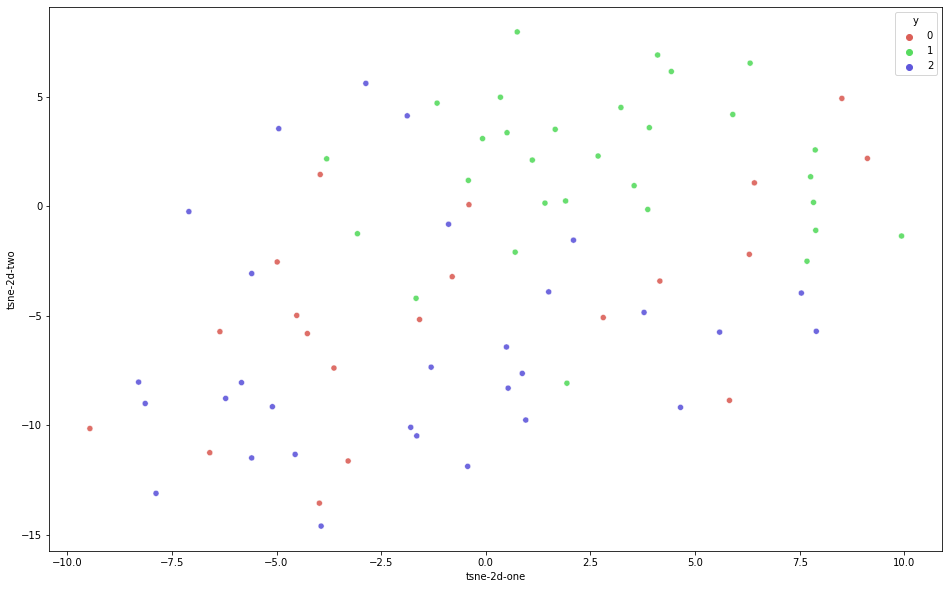

In [37]:
from sklearn.manifold import TSNE
import seaborn as sns

tsne = TSNE(n_components=2, verbose=1, perplexity=15, n_iter = 5000,learning_rate = 100,angle = 0.0005)

#the TSNE is done on the list of histograms because this is what we use for the classifier
tsne_results = tsne.fit_transform(histogram_list)

N = tsne_results.shape[0]


vect1=tsne_results[:,0]
#print(vect1)
vect2=tsne_results[:,1]
#print(vect2)
vect3=train_y
df=pd.DataFrame({'tsne-2d-one':vect1,'tsne-2d-two':vect2,'y':vect3})


plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue="y",
    palette=sns.color_palette("hls", 3),
    data=df,
    legend="full",
    alpha=0.9
)

### 1.3.2. Discussion

Initially, we used all features of all the training pictures to construct the histograms and use them to create the centers of the KNN algorithm. Because we were not getting good results with this technique and the t-SNE plot showed that the histograms were not discriminative and robust, we decided to experiment a bit with the clustering.
To improve this we added an additional pre-processing step to focus on the features that were also prominent in images with the same label for constructing the centers in the KNN algorithm. The motivation behind this adjustment is the fact that the extracted features in each image are not necessarily matched with other images and by focusing on the features that are consistent on all images, better accuracy could possibly be achieved. This was done by executing the following steps:

1. Grouping images and corresponding descriptors from the training set by their labels and storing this in a list
2. Looping through the descriptors of the images (of the same label, so e.g. all images of Mila), during which the descriptors of each image are matched with the rest of the descriptors in the list. The best matched features are then stored in a list where all prominent features are stored. This is done in the function named "extract_matched_features", and more details can be seen there. Note that this second step is performed only within each set (of the same label) and independent from other differently labelled images.
3. Storing all descriptors in one single list and k-means clustering to it. 

The rest of the algorithm remained unchanged and is described in the beginning of this chapter.


# 2. Evaluation Metrics

We will use three methods to evaluate the performance of each feature-classifer combinations: accuracy, confusion matrix and cross validation.
## 2.1. Accuracy
The first method we would like to use is accuray. However, learning the model and test it on the same data is a just methodological mistake: a model that would just repeat the labels of the samples that it has just seen would have a perfect score but would fail to predict anything useful on yet-unseen data. The problem is called overfitting.

The common solution to this problem is to split the dataset into training set, validation set and test set. The training set is used to learn the model. The validation set is used to evaluate the learned model while we are optimizing the hyperparameters values of models to get the best performance. In the end the test set is used to evaluate the final performance of the model. 

However, in our case we have a small amount of data(80 samples).If we still split the data into three sets, we drastically reduce the number of samples for learning the model, and the results can depend on the choice of splitting. 

In [38]:
from sklearn.metrics import accuracy_score

## 2.2. Cross Validation
A solution to the above problem is cross-validation (CV for short). In CV, validation set is no longer needed, we only need to split the data into training set and test set.


 In basic CV we need define the parameter of k: the dataset is split into k smaller sets and the following procedure is conducted for each of the k-'fold'

- a model is trained using k-1 of the folds as training set
- the resulting model is validated on the remaining part of the data, meaning that it is used as a test to obtain the performance measure such as accuracy
- use the statistic value of the k accuracies such as mean and standard deviation to represent model's performance. 

In [39]:
from sklearn.model_selection import cross_val_score

## 2.3 Confusion Matrix
Another interesting method is the confusion matrix, which indicates how often any two classed are mixed-up. The confusion matrix of a perfect classifier would only have nonzero entries on the diagonal, with zeros on the off-diagonal:

In [40]:
from sklearn.metrics import confusion_matrix

# 3. Experiments

In this part we will experiment different combinations of features and classifiers and review their performance. 

## 3.1. HOG + SGD(Stochastic Gradient Descent)

We will start with training a SGD classifier model with HOG features. We choose SGD to start with since it is fast and works reasonably fine, which we can used to compare the other feature-classifier combinations.

Let's build and train the classifier with the HOG feature from training data.

In [41]:
from sklearn.linear_model import SGDClassifier

clf = SGDClassifier(random_state=42, max_iter=1000, tol=1e-3)

# train the model on the features

clf.fit(train_X_HOG, train_y)

SGDClassifier(random_state=42)

Let's evaluate the model's performance on the training set:

In [42]:
from sklearn.model_selection import cross_val_score
scores = cross_val_score(clf, train_X_HOG, train_y, cv=5)
scores
print('Cross validation Result:')
print("%0.2f accuracy with a standard deviation of %0.2f" % (scores.mean(), scores.std()))

from sklearn import metrics
train_y_star = clf.predict(train_X_HOG)
print('Accuracy Result:')
print(metrics.classification_report(train_y, train_y_star))
print('Confusion Matrix Result:')
print(metrics.confusion_matrix(train_y, train_y_star))

Cross validation Result:
0.78 accuracy with a standard deviation of 0.05
Accuracy Result:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        20
           1       1.00      1.00      1.00        30
           2       1.00      1.00      1.00        30

    accuracy                           1.00        80
   macro avg       1.00      1.00      1.00        80
weighted avg       1.00      1.00      1.00        80

Confusion Matrix Result:
[[20  0  0]
 [ 0 30  0]
 [ 0  0 30]]


## 3.2. HOG + Linear SVM

Let's try HOG features with linear SVM

In [43]:
from sklearn.svm import SVC
clf = SVC(kernel='linear')
clf.fit(train_X_HOG, train_y)

SVC(kernel='linear')

In [44]:
from sklearn.model_selection import cross_val_score
scores = cross_val_score(clf, train_X_HOG, train_y, cv=5)
scores
print('Cross validation Result:')
print("%0.2f accuracy with a standard deviation of %0.2f" % (scores.mean(), scores.std()))

from sklearn import metrics
train_y_star = clf.predict(train_X_HOG)
print('Accuracy Result:')
print(metrics.classification_report(train_y, train_y_star))
print('Confusion Matrix Result:')
print(metrics.confusion_matrix(train_y, train_y_star))

Cross validation Result:
0.88 accuracy with a standard deviation of 0.09
Accuracy Result:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        20
           1       1.00      1.00      1.00        30
           2       1.00      1.00      1.00        30

    accuracy                           1.00        80
   macro avg       1.00      1.00      1.00        80
weighted avg       1.00      1.00      1.00        80

Confusion Matrix Result:
[[20  0  0]
 [ 0 30  0]
 [ 0  0 30]]


## 3.3. HOG + SVM with RBF kernel

Let's try HOG features with SVM with RBF kernel

In [45]:
from sklearn.svm import SVC
clf = SVC(kernel='rbf')
clf.fit(train_X_HOG, train_y)

SVC()

In [46]:
from sklearn.model_selection import cross_val_score
scores = cross_val_score(clf, train_X_HOG, train_y, cv=5)
scores
print('Cross validation Result:')
print("%0.2f accuracy with a standard deviation of %0.2f" % (scores.mean(), scores.std()))

from sklearn import metrics
train_y_star = clf.predict(train_X_HOG)
print('Accuracy Result:')
print(metrics.classification_report(train_y, train_y_star))
print('Confusion Matrix Result:')
print(metrics.confusion_matrix(train_y, train_y_star))

Cross validation Result:
0.89 accuracy with a standard deviation of 0.08
Accuracy Result:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        20
           1       1.00      1.00      1.00        30
           2       1.00      1.00      1.00        30

    accuracy                           1.00        80
   macro avg       1.00      1.00      1.00        80
weighted avg       1.00      1.00      1.00        80

Confusion Matrix Result:
[[20  0  0]
 [ 0 30  0]
 [ 0  0 30]]


## 3.4. PCA + Linear SVM 

Let's try PCA features with linear SVM

In [47]:
from sklearn.svm import SVC
clf = SVC(kernel='linear')
clf.fit(train_X_PCA, train_y)

SVC(kernel='linear')

In [48]:
from sklearn.model_selection import cross_val_score
scores = cross_val_score(clf, train_X_PCA, train_y, cv=5)
scores
print('Cross validation Result:')
print("%0.2f accuracy with a standard deviation of %0.2f" % (scores.mean(), scores.std()))

from sklearn import metrics
train_y_star = clf.predict(train_X_PCA)
print('Accuracy Result:')
print(metrics.classification_report(train_y, train_y_star))
print('Confusion Matrix Result:')
print(metrics.confusion_matrix(train_y, train_y_star))

Cross validation Result:
0.79 accuracy with a standard deviation of 0.12
Accuracy Result:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        20
           1       1.00      1.00      1.00        30
           2       1.00      1.00      1.00        30

    accuracy                           1.00        80
   macro avg       1.00      1.00      1.00        80
weighted avg       1.00      1.00      1.00        80

Confusion Matrix Result:
[[20  0  0]
 [ 0 30  0]
 [ 0  0 30]]


## 3.5. PCA + SVM with RBF Kernel 

Let's try PCA features with SVM with RBF kernel

In [49]:
from sklearn.svm import SVC
clf = SVC(kernel='rbf')
clf.fit(train_X_PCA, train_y)

SVC()

In [50]:
from sklearn.model_selection import cross_val_score
scores = cross_val_score(clf, train_X_PCA, train_y, cv=5)
scores
print('Cross validation Result:')
print("%0.2f accuracy with a standard deviation of %0.2f" % (scores.mean(), scores.std()))

from sklearn import metrics
train_y_star = clf.predict(train_X_PCA)
print('Accuracy Result:')
print(metrics.classification_report(train_y, train_y_star))
print('Confusion Matrix Result:')
print(metrics.confusion_matrix(train_y, train_y_star))

Cross validation Result:
0.70 accuracy with a standard deviation of 0.07
Accuracy Result:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        20
           1       1.00      1.00      1.00        30
           2       1.00      1.00      1.00        30

    accuracy                           1.00        80
   macro avg       1.00      1.00      1.00        80
weighted avg       1.00      1.00      1.00        80

Confusion Matrix Result:
[[20  0  0]
 [ 0 30  0]
 [ 0  0 30]]


## 3.6. PCA + Logistic regression

In [51]:
from sklearn.linear_model import LogisticRegression
clf = LogisticRegression(solver = 'liblinear', random_state = 0, tol = 1e-4)
clf.fit(train_X_PCA, train_y)

LogisticRegression(random_state=0, solver='liblinear')

In [52]:
from sklearn.model_selection import cross_val_score
scores = cross_val_score(clf, train_X_PCA, train_y, cv=5)
scores
print('Cross validation Result:')
print("%0.2f accuracy with a standard deviation of %0.2f" % (scores.mean(), scores.std()))

from sklearn import metrics
train_y_star = clf.predict(train_X_PCA)
print('Accuracy Result:')
print(metrics.classification_report(train_y, train_y_star))
print('Confusion Matrix Result:')
print(metrics.confusion_matrix(train_y, train_y_star))

Cross validation Result:
0.62 accuracy with a standard deviation of 0.09
Accuracy Result:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        20
           1       1.00      1.00      1.00        30
           2       1.00      1.00      1.00        30

    accuracy                           1.00        80
   macro avg       1.00      1.00      1.00        80
weighted avg       1.00      1.00      1.00        80

Confusion Matrix Result:
[[20  0  0]
 [ 0 30  0]
 [ 0  0 30]]


## 3.7. PCA + Decision Tree

In [53]:
from sklearn.tree import DecisionTreeClassifier
clf = DecisionTreeClassifier().fit(train_X_PCA, train_y)

In [54]:
from sklearn.model_selection import cross_val_score
scores = cross_val_score(clf, train_X_PCA, train_y, cv=5)
scores
print('Cross validation Result:')
print("%0.2f accuracy with a standard deviation of %0.2f" % (scores.mean(), scores.std()))

from sklearn import metrics
train_y_star = clf.predict(train_X_PCA)
print('Accuracy Result:')
print(metrics.classification_report(train_y, train_y_star))
print('Confusion Matrix Result:')
print(metrics.confusion_matrix(train_y, train_y_star))

Cross validation Result:
0.55 accuracy with a standard deviation of 0.13
Accuracy Result:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        20
           1       1.00      1.00      1.00        30
           2       1.00      1.00      1.00        30

    accuracy                           1.00        80
   macro avg       1.00      1.00      1.00        80
weighted avg       1.00      1.00      1.00        80

Confusion Matrix Result:
[[20  0  0]
 [ 0 30  0]
 [ 0  0 30]]


## 3.8. PCA + KNN

In [55]:
from sklearn.neighbors import KNeighborsClassifier
clf = KNeighborsClassifier(n_neighbors=10, weights = 'distance', leaf_size = 50)
clf.fit(train_X_PCA, train_y)

KNeighborsClassifier(leaf_size=50, n_neighbors=10, weights='distance')

In [56]:
from sklearn.model_selection import cross_val_score
scores = cross_val_score(clf, train_X_PCA, train_y, cv=5)
scores
print('Cross validation Result:')
print("%0.2f accuracy with a standard deviation of %0.2f" % (scores.mean(), scores.std()))

from sklearn import metrics
train_y_star = clf.predict(train_X_PCA)
print('Accuracy Result:')
print(metrics.classification_report(train_y, train_y_star))
print('Confusion Matrix Result:')
print(metrics.confusion_matrix(train_y, train_y_star))

Cross validation Result:
0.71 accuracy with a standard deviation of 0.13
Accuracy Result:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        20
           1       1.00      1.00      1.00        30
           2       1.00      1.00      1.00        30

    accuracy                           1.00        80
   macro avg       1.00      1.00      1.00        80
weighted avg       1.00      1.00      1.00        80

Confusion Matrix Result:
[[20  0  0]
 [ 0 30  0]
 [ 0  0 30]]


## 3.8. SIFT + MLP

In [57]:
from sklearn.neural_network import MLPClassifier
#using a multi layer perceptron with the default amount of hidden layers (100)
clf= MLPClassifier(verbose=False,max_iter=600000)
clf.fit(train_X_SIFT, train_y)

MLPClassifier(max_iter=600000)

In [58]:
from sklearn.model_selection import cross_val_score
scores = cross_val_score(clf, train_X_SIFT, train_y, cv=5)
scores
print('Cross validation Result:')
print("%0.2f accuracy with a standard deviation of %0.2f" % (scores.mean(), scores.std()))

from sklearn import metrics
train_y_star = clf.predict(train_X_SIFT)
print('Accuracy Result:')
print(metrics.classification_report(train_y, train_y_star))
print('Confusion Matrix Result:')
print(metrics.confusion_matrix(train_y, train_y_star))

Cross validation Result:
0.59 accuracy with a standard deviation of 0.10
Accuracy Result:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        20
           1       1.00      1.00      1.00        30
           2       1.00      1.00      1.00        30

    accuracy                           1.00        80
   macro avg       1.00      1.00      1.00        80
weighted avg       1.00      1.00      1.00        80

Confusion Matrix Result:
[[20  0  0]
 [ 0 30  0]
 [ 0  0 30]]


## 3.8. SIFT + SVM with RBF kernel

In [59]:
from sklearn.svm import SVC
clf = SVC(kernel='rbf')
clf.fit(train_X_SIFT, train_y)

SVC()

In [60]:
from sklearn.model_selection import cross_val_score
scores = cross_val_score(clf, train_X_SIFT, train_y, cv=5)
scores
print('Cross validation Result:')
print("%0.2f accuracy with a standard deviation of %0.2f" % (scores.mean(), scores.std()))

from sklearn import metrics
train_y_star = clf.predict(train_X_SIFT)
print('Accuracy Result:')
print(metrics.classification_report(train_y, train_y_star))
print('Confusion Matrix Result:')
print(metrics.confusion_matrix(train_y, train_y_star))

Cross validation Result:
0.61 accuracy with a standard deviation of 0.05
Accuracy Result:
              precision    recall  f1-score   support

           0       1.00      0.80      0.89        20
           1       0.91      1.00      0.95        30
           2       0.94      0.97      0.95        30

    accuracy                           0.94        80
   macro avg       0.95      0.92      0.93        80
weighted avg       0.94      0.94      0.94        80

Confusion Matrix Result:
[[16  2  2]
 [ 0 30  0]
 [ 0  1 29]]


# 4 Hybrid Method

We have discussed three feature representation techiniques before: HOG, SIFT and PCA. HOG and SIFT are feature-base methods while PCA is holistic method. Before deep learning became popular, most state-of-the-art face recognition system were based on hybrid methods, which can benefit the advantages of both methods. 

## 4.1  Simple Combination Hybrid
There are various way of hybrid methods, but here we will demostrate a simply idea: just combine all the feature vectors from HOG, SIFT and PCA and normalize them, then use a classifer to learn and predict. Let's see how it will work!

Create the scaler object for normalizing 

In [61]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

Scale and normalize all the feature vectors

In [62]:
train_X_SIFT_NORM = scaler.fit_transform(train_X_SIFT)
test_X_SIFT_NORM = scaler.transform(test_X_SIFT)

train_X_HOG_NORM = scaler.fit_transform(train_X_HOG)
test_X_HOG_NORM = scaler.transform(test_X_HOG)

train_X_PCA_NORM = scaler.fit_transform(train_X_PCA)
test_X_PCA_NORM = scaler.transform(test_X_PCA)

Combine SIFT+HOG+PCA

In [63]:
print(train_X_SIFT_NORM.shape)
print(train_X_HOG_NORM.shape)
print(train_X_PCA_NORM.shape)
train_X_features = np.append(train_X_PCA_NORM, train_X_SIFT_NORM, axis=1)
train_X_features = np.append(train_X_features, train_X_HOG_NORM, axis=1)
print(train_X_features.shape)

(80, 30)
(80, 1296)
(80, 68)
(80, 1394)


In [64]:
print(test_X_SIFT_NORM.shape)
print(test_X_HOG_NORM.shape)
print(test_X_PCA_NORM.shape)
test_X_features = np.append(test_X_PCA_NORM, test_X_SIFT_NORM, axis=1)
test_X_features = np.append(test_X_features, test_X_HOG_NORM, axis=1)
print(test_X_features.shape)

(1816, 30)
(1816, 1296)
(1816, 68)
(1816, 1394)


Let's now train some classifier for the hybrid feature

## 4.2 Hybrid + SGD SVM

In [65]:
from sklearn.linear_model import SGDClassifier
clf = SGDClassifier(max_iter=1000, tol=1e-4)
clf.fit(train_X_features, train_y)

SGDClassifier(tol=0.0001)

In [66]:
from sklearn.model_selection import cross_val_score
scores = cross_val_score(clf, train_X_features, train_y, cv=5)
scores
print('Cross validation Result:')
print("%0.2f accuracy with a standard deviation of %0.2f" % (scores.mean(), scores.std()))

from sklearn import metrics
train_y_star = clf.predict(train_X_features)
print('Accuracy Result:')
print(metrics.classification_report(train_y, train_y_star))
print('Confusion Matrix Result:')
print(metrics.confusion_matrix(train_y, train_y_star))

Cross validation Result:
0.81 accuracy with a standard deviation of 0.09
Accuracy Result:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        20
           1       1.00      1.00      1.00        30
           2       1.00      1.00      1.00        30

    accuracy                           1.00        80
   macro avg       1.00      1.00      1.00        80
weighted avg       1.00      1.00      1.00        80

Confusion Matrix Result:
[[20  0  0]
 [ 0 30  0]
 [ 0  0 30]]


## 4.3 Hybrid + Logistic regression

In [67]:
from sklearn.linear_model import LogisticRegression
clf = LogisticRegression(solver = 'liblinear', random_state = 0, tol = 1e-6)
clf.fit(train_X_features, train_y)

LogisticRegression(random_state=0, solver='liblinear', tol=1e-06)

In [68]:
from sklearn.model_selection import cross_val_score
scores = cross_val_score(clf, train_X_features, train_y, cv=5)
scores
print('Cross validation Result:')
print("%0.2f accuracy with a standard deviation of %0.2f" % (scores.mean(), scores.std()))

from sklearn import metrics
train_y_star = clf.predict(train_X_features)
print('Accuracy Result:')
print(metrics.classification_report(train_y, train_y_star))
print('Confusion Matrix Result:')
print(metrics.confusion_matrix(train_y, train_y_star))

Cross validation Result:
0.79 accuracy with a standard deviation of 0.08
Accuracy Result:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        20
           1       1.00      1.00      1.00        30
           2       1.00      1.00      1.00        30

    accuracy                           1.00        80
   macro avg       1.00      1.00      1.00        80
weighted avg       1.00      1.00      1.00        80

Confusion Matrix Result:
[[20  0  0]
 [ 0 30  0]
 [ 0  0 30]]


In [69]:
test_y_star =  clf.predict(test_X_features)

## 4.3 Hybrid + Linear SVM

In [70]:
from sklearn.svm import SVC
clf = SVC(kernel='linear')
clf.fit(train_X_features, train_y)

SVC(kernel='linear')

In [71]:
from sklearn.model_selection import cross_val_score
scores = cross_val_score(clf, train_X_features, train_y, cv=5)
scores
print('Cross validation Result:')
print("%0.2f accuracy with a standard deviation of %0.2f" % (scores.mean(), scores.std()))

from sklearn import metrics
train_y_star = clf.predict(train_X_features)
print('Accuracy Result:')
print(metrics.classification_report(train_y, train_y_star))
print('Confusion Matrix Result:')
print(metrics.confusion_matrix(train_y, train_y_star))

Cross validation Result:
0.89 accuracy with a standard deviation of 0.07
Accuracy Result:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        20
           1       1.00      1.00      1.00        30
           2       1.00      1.00      1.00        30

    accuracy                           1.00        80
   macro avg       1.00      1.00      1.00        80
weighted avg       1.00      1.00      1.00        80

Confusion Matrix Result:
[[20  0  0]
 [ 0 30  0]
 [ 0  0 30]]


With the same classifer, the hybrid method show some improvement when comparing to just using one type of feature.

# 5: Achieving a high score using transfer learning with VGGFace 2

Since the next assignment will be about deep learning, we did not want to focus on this aspect too much. we wanted to really learn what SIFT, HOG and PCA are all about. However, this is still the best way to get a good score on the Kaggle competittion. This is why we decided to use VGGFace 2 from https://github.com/rcmalli/keras-vggface to test this. From this Github we can choose a model that was pretrained on the VGGFace dataset for face detection. The options are vgg16, resnet50 and sesnet50. These are all popular transfer learning models. We decided to first use the default vgg16 network, of which a schematic view can be seen on the below image. 

<center><img src="https://neurohive.io/wp-content/uploads/2018/11/vgg16-1-e1542731207177.png"/></center>

The fact that it was pretrained on the VGGFace dataset will make it perform well but this is also a problem! The data that we are using also comes from the VGGFace dataset. This means that the pictures in our test set were used in the training process of the model so the model has already seen all these pictures and knows who is on it. Because we consider this as cheating, we decided to continue to improve our SIFT/HOG/PCA classifier and abandon this route. This is only to show that deep learning method is the current state of the art face recoginization method. 

***This part of code is commented out to make the submission faster!***

Here we install and import the required libaries

In [72]:
# pip install git+https://github.com/rcmalli/keras-vggface.git

In [73]:
# !pip install keras_applications --no-deps
# !pip install keras_preprocessing --no-deps

In [74]:
# from keras.preprocessing import image
# from keras_vggface.vggface import VGGFace
# from keras_vggface import utils

Here we create a list of face images from test set.

In [75]:
# test_X_VGGFACE = []
# for img in test_X:
#     x = image.img_to_array(img)
#     x = cv2.resize(x,(224,224),interpolation=cv2.INTER_AREA)
#     x = np.expand_dims(x,axis=0)
#     x = utils.preprocess_input(x, version=1)
#     test_X_VGGFACE.append(x)

Then we create the VGGFace Model and use it for prediction.

In [76]:
# model = VGGFace()
# vggface_preds = []

# for x in test_X_VGGFACE:
#     preds = model.predict(x)
#     name = utils.decode_predictions(preds)[0][0][0]
#     name = name.split("'")[-2]
#     if name == 'Jesse_Eisenberg':
#         vggface_preds.append(1)
#     elif name == 'Mila_Kunis':
#         vggface_preds.append(2)
#     else:
#         vggface_preds.append(0)

Now we get the prediction for the test set using VGGFace model.This gives a prediction score of 0.91685.

# 6. Results

## 6.1 Submission of the Best Result

In [77]:
submission = test.copy().drop('img', axis = 1)
submission['class'] = test_y_star

submission

,class
id,
0,1
1,2
2,0
3,1
4,1
...,...
1811,1
1812,0
1813,1


In [78]:
submission.to_csv('/kaggle/working/HYBRID_LR_final_submission.csv')

## 6.2 Overview Results of Cross Validation

For the cross validation results, we have the following key findings:
* Hybrid feature + Linear SVM classifer had the best prediction score. 
* With the same classifer, the Hybrid method showed better prediction performance than any other feature we implemented.
* The decision tree classifer gave the worst prediction result with the PCA features in terms of both mean and STD of the accuracy. 

## 6.3 Overview Results of the Submitted Scores

For the submitted score result, we have the following key findings:
    
* VGGFace with transfer learning gave the best prediction score above 0.9
* Hybrid feature + Logistic regression classifer gave the second best score of about 0.82.
* PCA + logistic regression classifer give the best score of 0.74 when we only use one type of feature representation.   
* SIFT + SGD classifier gave the worst prediction score of about 0.33, which is the similar performance as a random generator.


# 7. Discussion
...

In summary we contributed the following in this notebook: 
* We cleaned the preprocessed the training data so that we can extract correct face images from all the training data. 
* We extracted feature vectors from the training face images by using both holistic(PCA) and feature-based(HOG, SIFT) methods.
* We experimented different combinations of features and classifiers and evaluate their performance using cross validation. 
* We implemented a simple hybrid feature representation method and evaluate its performance. 
* We used the pre-trained VGGFace model for predication via transfer learning and evaluate its performance. 

Here are the key findings and our interpretations:
* HOG feature extraction still produces a relatively higher dimensional feature vector comparing to PCA and SIFT. This is due to the calcuation of the HOG feature, which is trying to calculate all the features around the image, even the features are not important for the object detection. And the bigger the image, the higher the feature dimension is. We need to have classifer which can handle high dimensional data such as SVM.

* With the same PCA features, different classifers can have very different accuracy score ranging from 0.41 (decision tree) to 0.74 (logistic regression). Since PCA is a statistical representaion, model such as logistic regression is more suitable for classification. However, model like decision tree, with lack of training samples and high dimensional input data, is more likely to suffer the problem overfitting. 

* Hybrid method can give a better performance than an single feature extraction, even simply just by combining different feature vectors together into one. Hybrid method can benefit from the advantages of different feature representation methods. 

* Nowadays the deep learning method is the-state-of-art comparing to the traditional feature representation method. 



In the notebook we have notice the following limitations:

* The performance of SIFT combined with bag of words is not the best and there is very limited space for further improvement. The algorithm does not always succeed in identifying the feature correctly. 

* For PCA feature extraction, the quality of obtained eignenfaces are heavily affected by the training examples, which are not perfectly aligned. 

To further imporve the performance, we recommend to try the following:

* Perform face alignment for the training data, which can improve the performance of holistic method such as PCA. 

* Increase the training data size by augmenting the data(mirroring, rotating, .....).

* Train mutilple classification models and ensemble them for the final prediction.

* Use more advanced hybrid methods, for example, first perform HOG feature extraction and then perfrom PCA transform of the HOG feature. 






***Thanks for reading this notebook, hope you find it useful and interesting!***